In [96]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt

In [249]:
data_2015 = pickle.load(open('../data/df_distance_probs_new.pickle','rb'))

In [250]:
data_2015.rename({'probs_act':'probs_activity'}, inplace=True, axis=1)

In [251]:
data_2015.columns

Index(['ID', 'timestamp', 'Day_of_Week', 'State', 'Tweet', 'mentioned_food',
       'mentioned_activity', 'target', 'distance_1_food',
       'distance_1_activity', 'distance_2_food', 'distance_2_activity',
       'distance_3_food', 'distance_3_activity', 'distance_4_food',
       'distance_4_activity', 'true_food', 'true_act', 'probs_food',
       'preds_food', 'probs_activity', 'preds_act'],
      dtype='object')

In [252]:
data_2015['timestamp'] = data_2015['timestamp'].apply(lambda x: pd.Timestamp(x, unit='s'))

In [253]:
data_2015['month'] = data_2015['timestamp'].apply(lambda x: x.month)

In [254]:
data_2015_06 = data_2015[(data_2015['month'] == 6) | (data_2015['month'] == 7)]
data_2015_11 = data_2015[(data_2015['month'] == 11) | (data_2015['month'] == 12)]

In [255]:
def get_frequency(df):
    num1 = sum(df['target']==1)
    num2 = sum(df['target']==2)
    num3 = sum(df['target']==3)
    return pd.DataFrame([[(num1+num3)/len(df),(num2+num3)/len(df),df['probs_food'].mean(),df['probs_activity'].mean()]]
                        ,columns=['food_freq','activity_freq', 'randomforest_food_freq', 'randomforest_activity_freq'])
def cala_fre(data):
    result = data[['Day_of_Week','target','probs_food', 'probs_activity']].groupby('Day_of_Week')['target','probs_food', 'probs_activity'].apply(get_frequency)
    result.reset_index(level=1,drop=True,inplace=True)
    return result.loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]

result_2015_06 = cala_fre(data_2015_06)
result_2015_11 = cala_fre(data_2015_11)

In [256]:
def cala_freq_state(data):
    result = data[['Day_of_Week','State','target','probs_food', 'probs_activity']].groupby(['State','Day_of_Week'])['target','probs_food', 'probs_activity'].apply(get_frequency)
    result.reset_index(level=2,drop=True,inplace=True)
    return result

total_data = [data_2015_06, data_2015_11]
total_result = []
for data in total_data:
    total_result.append(cala_freq_state(data))

In [257]:
result_2015_06

,food_freq,activity_freq,randomforest_food_freq,randomforest_activity_freq
Day_of_Week,,,,
Monday,0.045232,0.045832,0.296433,0.254996
Tuesday,0.047271,0.046892,0.299564,0.258365
Wednesday,0.047690,0.047128,0.303697,0.260398
Thursday,0.048906,0.046970,0.305340,0.260905
Friday,0.050803,0.045820,0.308794,0.259329
Saturday,0.057444,0.046591,0.315940,0.255577
Sunday,0.055983,0.045017,0.310447,0.254748


In [62]:
state_data = pd.read_csv('../data/state.csv', names=['state_id','state','state_name','a'],
                         usecols=['state_id','state','state_name'],
                         index_col=['state_id'],header=None)
state = [1,  4,  5,  6,  8,  9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22,
       23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
       40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56]    
state_data = state_data.loc[state]

In [63]:
state_data

,state,state_name
state_id,,
1,AL,Alabama
4,AZ,Arizona
5,AR,Arkansas
6,CA,California
8,CO,Colorado
9,CT,Connecticut
10,DE,Delaware
11,DC,District_of_Columbia
12,FL,Florida


In [261]:
def show_state_freq(current_state_index):
    
    current_state_name = state_data.loc[current_state_index]['state_name']
    


    plt.figure(figsize=(15,15))


    plt.subplot(3, 2, 1)
    ax = plt.gca()
    ax.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['food_freq'].values,'r')
    ax.plot(result_2015_06['food_freq'].values, 'r--')
    ax.set_ylabel('keyword mentioned freq', color='red')
    ax.tick_params('y', colors='red')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax.set_title('2015-06 food mention freq vs prob')
    ax.legend([current_state_name+'(key word)','overall(key word)' ],loc=2)
    
    ax1 = ax.twinx()
    ax1.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_food_freq'].values, 'b')
    ax1.plot(result_2015_06['randomforest_food_freq'].values, 'b--')
    ax1.set_ylabel('average prob', color='blue')
    ax1.tick_params('y', colors='blue')
    fig = plt.gcf()
    fig.tight_layout()
    ax1.legend([current_state_name+'(rf)','overall(rf)' ],loc=1)
    
    
    
    
    
    
    
    plt.subplot(3, 2, 2)
    ax = plt.gca()
    ax.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['activity_freq'].values,'r')
    ax.plot(result_2015_06['activity_freq'].values, 'r--')
    ax.set_ylabel('keyword mentioned freq', color='red')
    ax.tick_params('y', colors='red')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax.set_title('2015-06 food mention freq vs prob')
    ax.legend([current_state_name+'(key word)','overall(key word)' ],loc=2)
    
    ax1 = ax.twinx()
    ax1.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_activity_freq'].values, 'b')
    ax1.plot(result_2015_06['randomforest_activity_freq'].values, 'b--')
    ax1.set_ylabel('average prob', color='blue')
    ax1.tick_params('y', colors='blue')
    fig = plt.gcf()
    fig.tight_layout()
    ax1.legend([current_state_name+'(rf)','overall(rf)' ],loc=1)
    
    
    
    
    
    plt.subplot(3, 2, 3)
    ax = plt.gca()
    ax.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['food_freq'].values,'r')
    ax.plot(result_2015_11['food_freq'].values, 'r--')
    ax.set_ylabel('keyword mentioned freq', color='red')
    ax.tick_params('y', colors='red')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax.set_title('2015-11 food mention freq vs prob')
    ax.legend([current_state_name+'(key word)','overall(key word)' ],loc=2)
    
    ax1 = ax.twinx()
    ax1.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_food_freq'].values, 'b')
    ax1.plot(result_2015_11['randomforest_food_freq'].values, 'b--')
    ax1.set_ylabel('average prob', color='blue')
    ax1.tick_params('y', colors='blue')
    fig = plt.gcf()
    fig.tight_layout()
    ax1.legend([current_state_name+'(rf)','overall(rf)' ],loc=1)
    
    
    
    
    
    
    
    
    plt.subplot(3, 2, 4)
    ax = plt.gca()
    ax.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['activity_freq'].values,'r')
    ax.plot(result_2015_11['activity_freq'].values, 'r--')
    ax.set_ylabel('keyword mentioned freq', color='red')
    ax.tick_params('y', colors='red')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax.set_title('2015-11 food mention freq vs prob')
    ax.legend([current_state_name+'(key word)','overall(key word)' ],loc=2)
    
    ax1 = ax.twinx()
    ax1.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_activity_freq'].values, 'b')
    ax1.plot(result_2015_11['randomforest_activity_freq'].values, 'b--')
    ax1.set_ylabel('average prob', color='blue')
    ax1.tick_params('y', colors='blue')
    fig = plt.gcf()
    fig.tight_layout()
    ax1.legend([current_state_name+'(rf)','overall(rf)' ],loc=1)
    
    
    
    
    

    plt.subplot(3, 2, 5)
    ax = plt.gca()
    ax.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['food_freq'].values, 'r')
    ax.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['food_freq'].values, 'r-.')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax.set_ylabel('keyword mentioned freq', color='red')
    ax.tick_params('y', colors='red')
    ax.set_title('summary food mentioned freq vs prob')
    ax.legend(['2015-06(key word)','2015-11(key word)' ],loc=2)
    
    ax1 = ax.twinx()
    ax1.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_food_freq'].values, 'b')
    ax1.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_food_freq'].values, 'b-.')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax1.set_ylabel('keyword mentioned freq', color='blue')
    ax1.tick_params('y', colors='blue')
    fig = plt.gcf()
    fig.tight_layout()
    ax1.legend(['2015-06(rf)','2015-11(rf)' ],loc=1)
    
    
    
    
    
    
    
    
    
    

    plt.subplot(3, 2, 6)
    ax = plt.gca()
    ax.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['activity_freq'].values, 'r')
    ax.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['activity_freq'].values, 'r-.')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax.set_ylabel('keyword mentioned freq', color='red')
    ax.tick_params('y', colors='red')
    ax.set_title('summary food mentioned freq vs prob')
    ax.legend(['2015-06(key word)','2015-11(key word)' ],loc=2)
    
    ax1 = ax.twinx()
    ax1.plot(total_result[0].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_activity_freq'].values, 'b')
    ax1.plot(total_result[1].loc[current_state_index].loc[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]['randomforest_activity_freq'].values, 'b-.')
    plt.xticks(range(7), ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    ax1.set_ylabel('keyword mentioned freq', color='blue')
    ax1.tick_params('y', colors='blue')
    fig = plt.gcf()
    fig.tight_layout()
    ax1.legend(['2015-06(rf)','2015-11(rf)' ],loc=1)
    
    #plt.show()


    plt.savefig('../data/figure_food_activity_mention_freq/'+current_state_name+'.png')

/Users/qintailiu/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


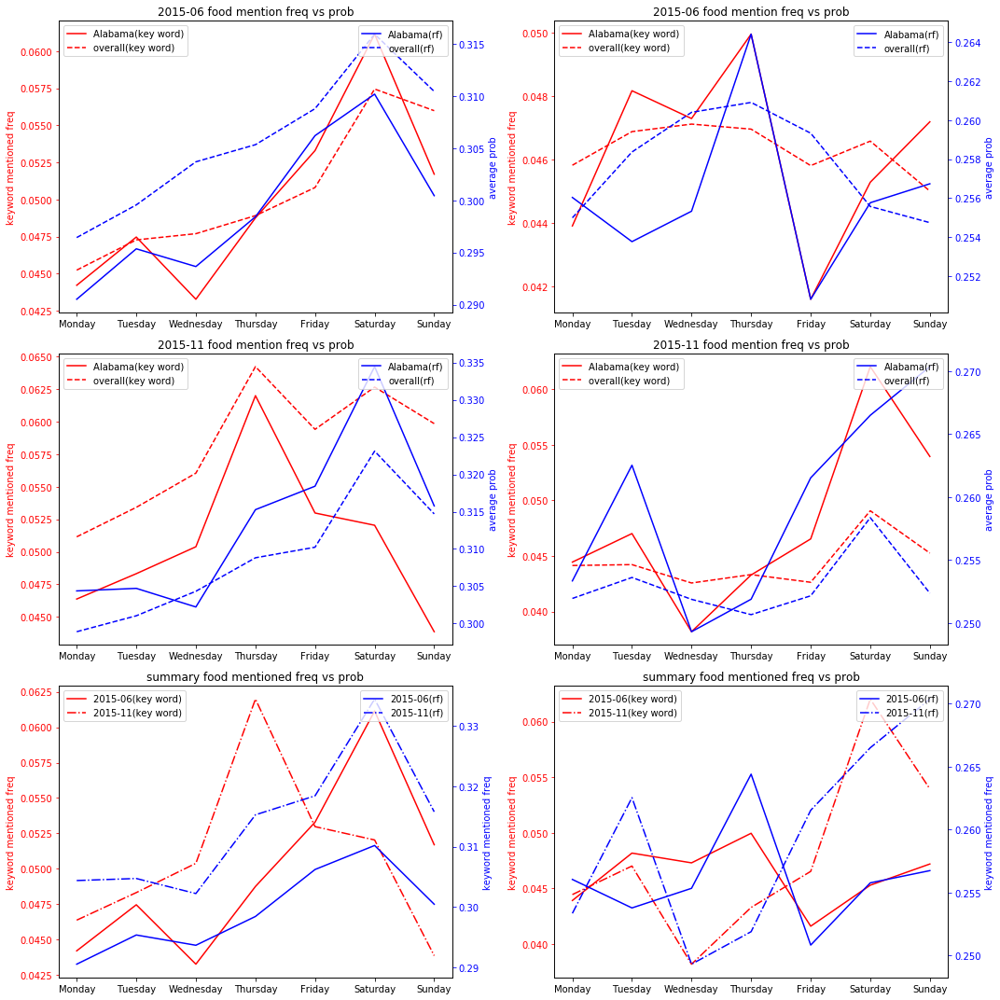

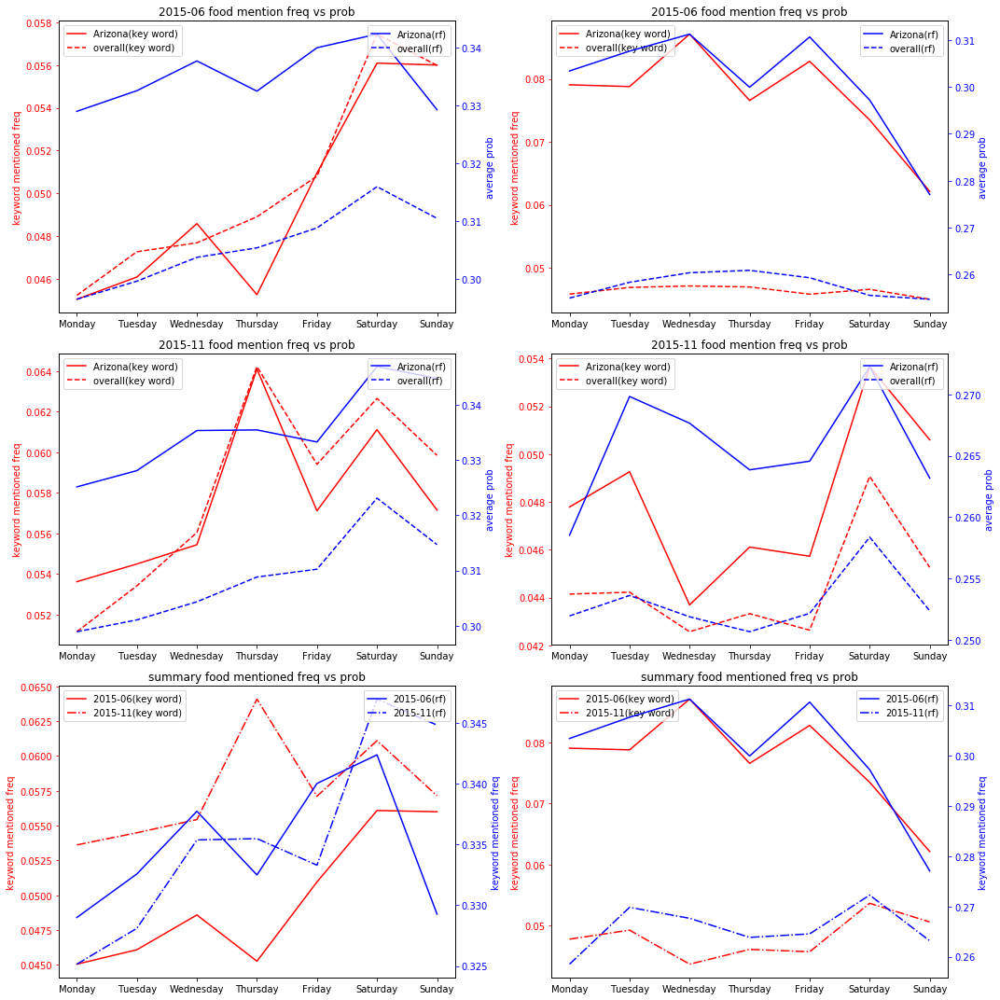

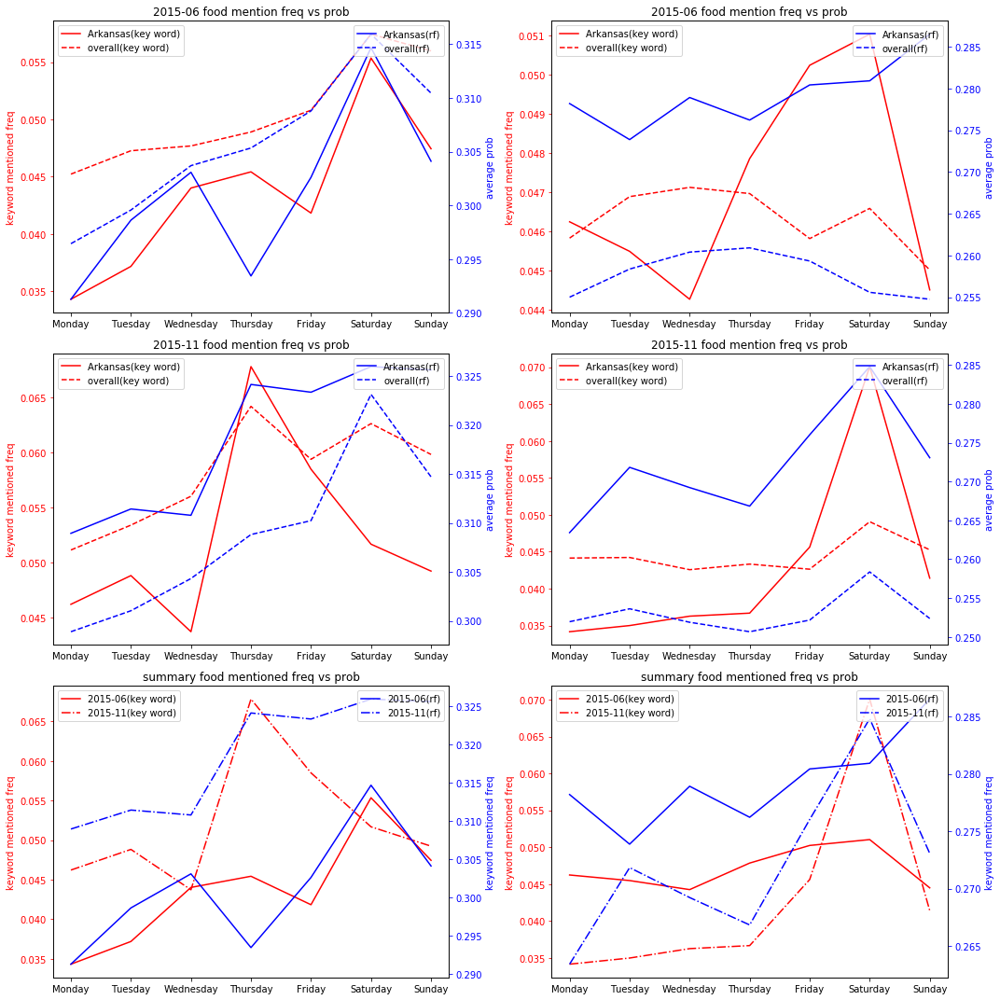

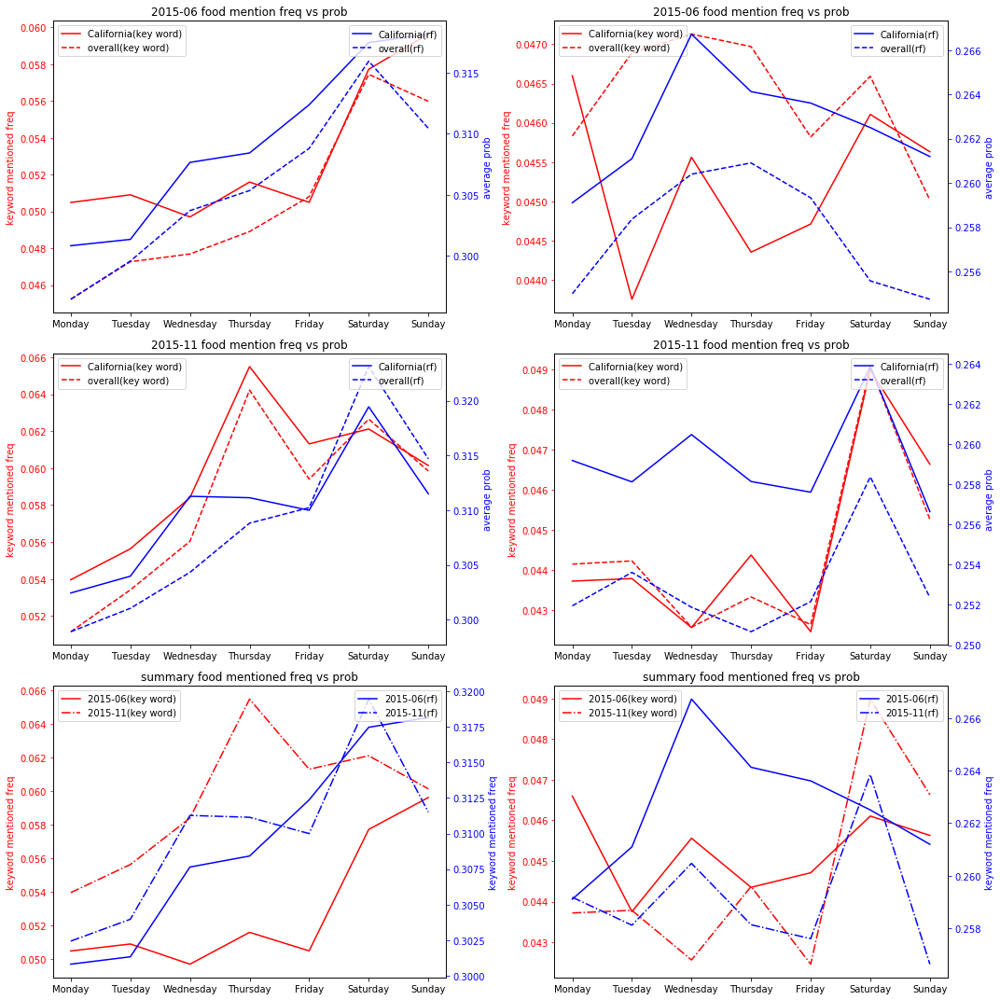

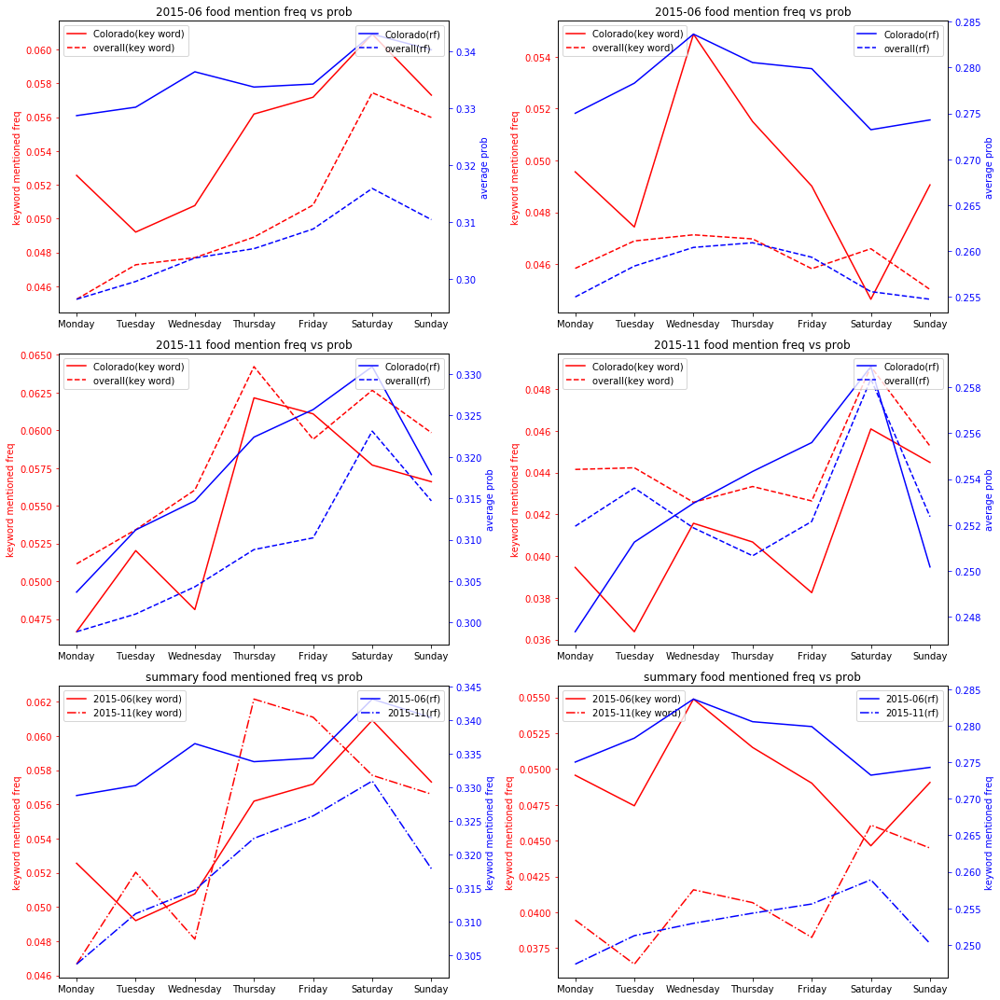

...

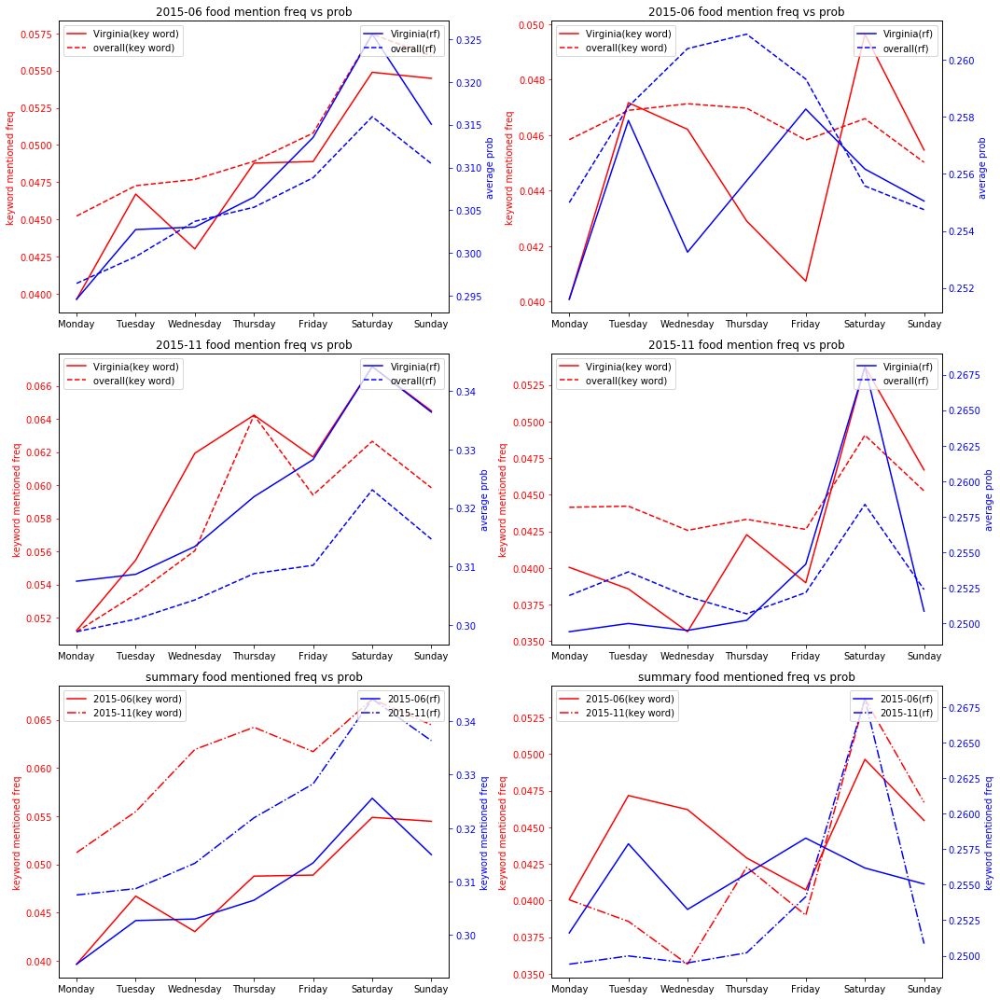

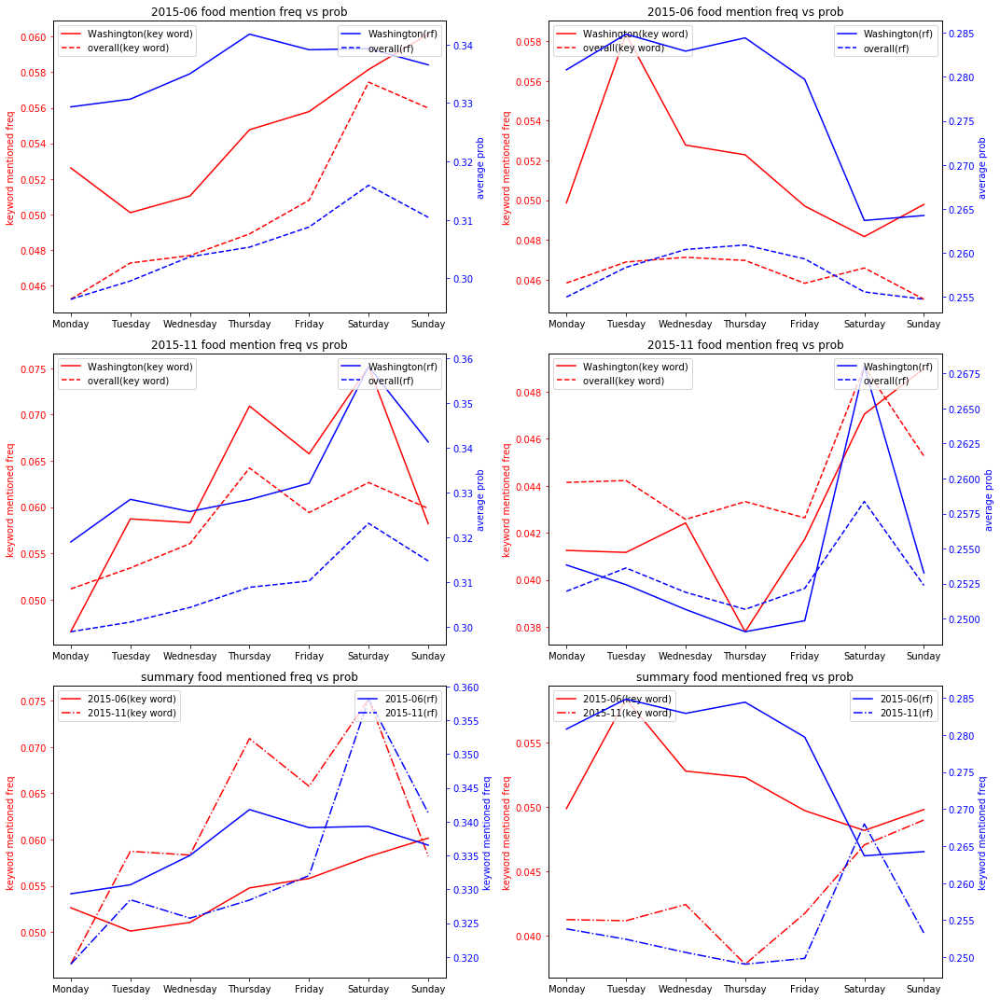

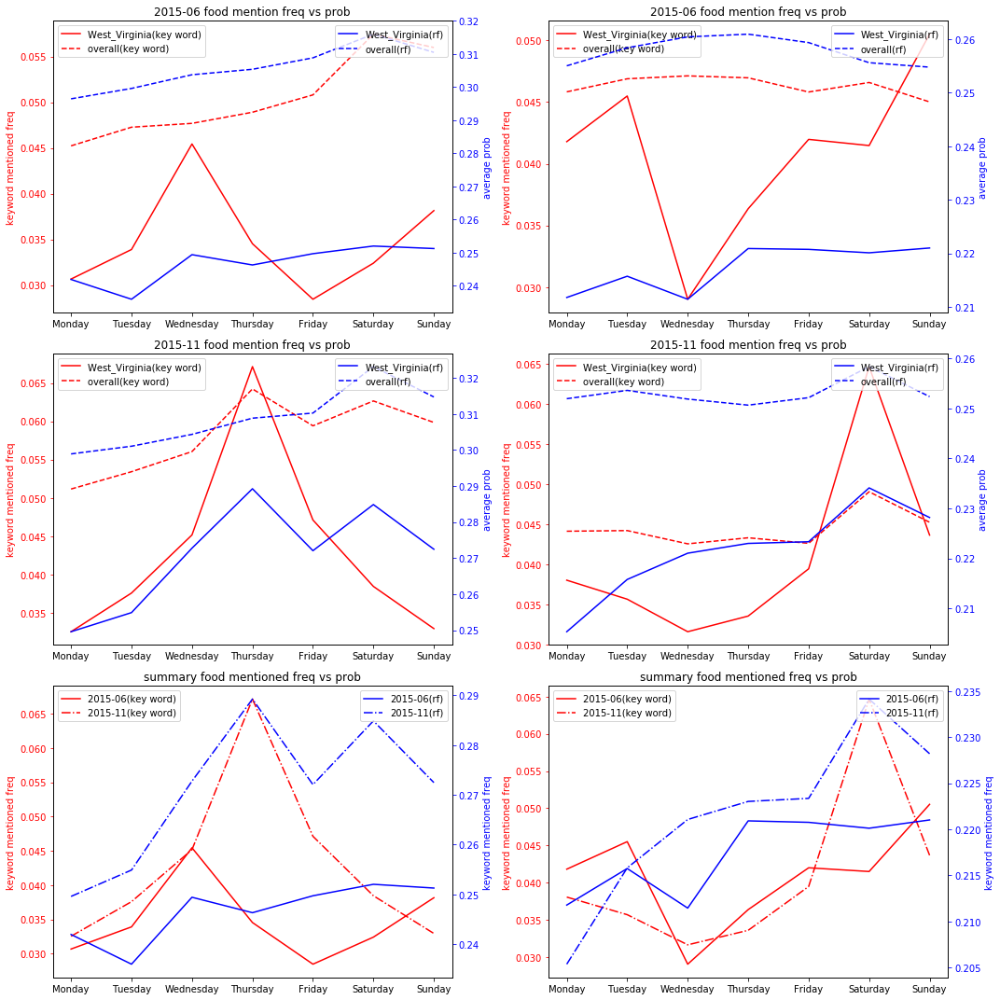

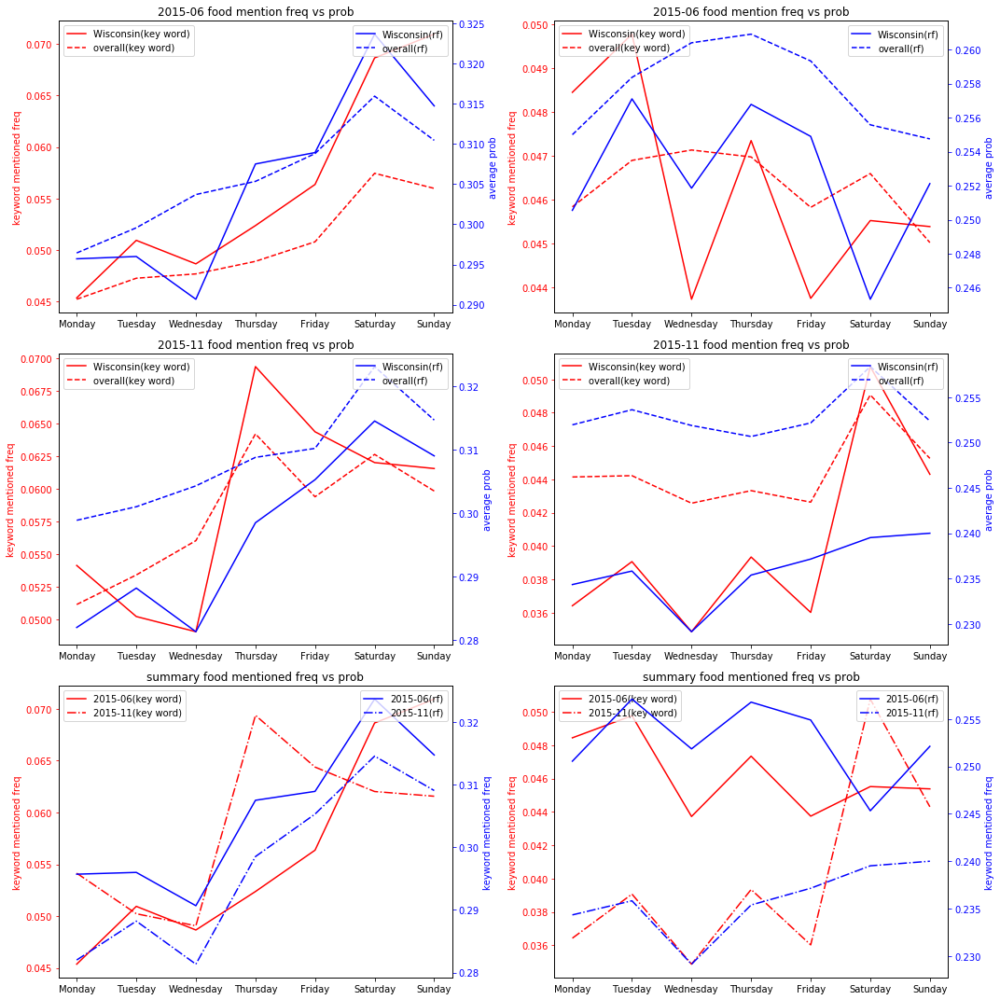

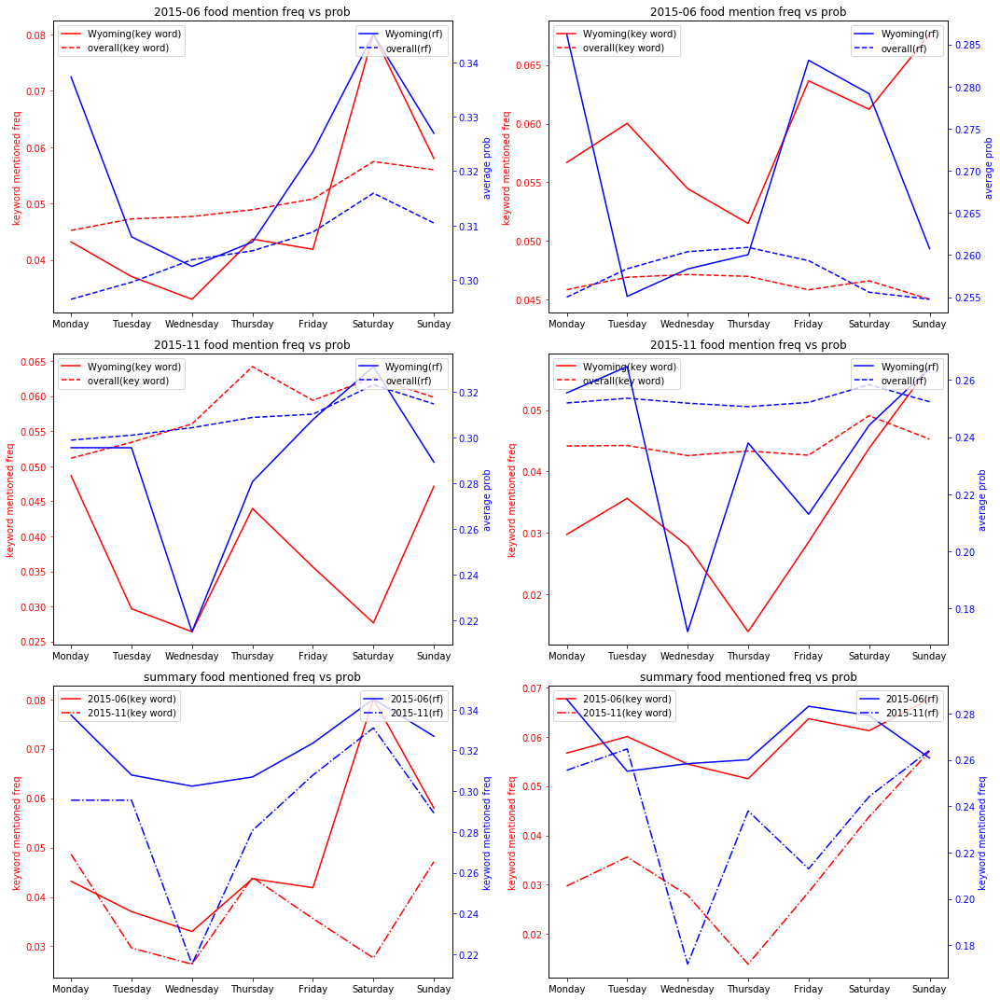

In [262]:
for state_index in state:
    show_state_freq(state_index)